<a href="https://colab.research.google.com/github/afifahsalsa/PCVK_Genap_2023/blob/main/Week_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Object Detection**

Metode yang digunakan:
1. Template Matching
2. Edge Detection
3. Corener Detection
4. Grid Detection
5. Contour Detection


In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Template Matching**

2. Menggunakan library openCV cv.matchTemplate() dengan parameter
- image: citra input
- templ: template yg dicari, ukurannya tidak boleh lebih besar dari citra input
- method: metode dari template matching

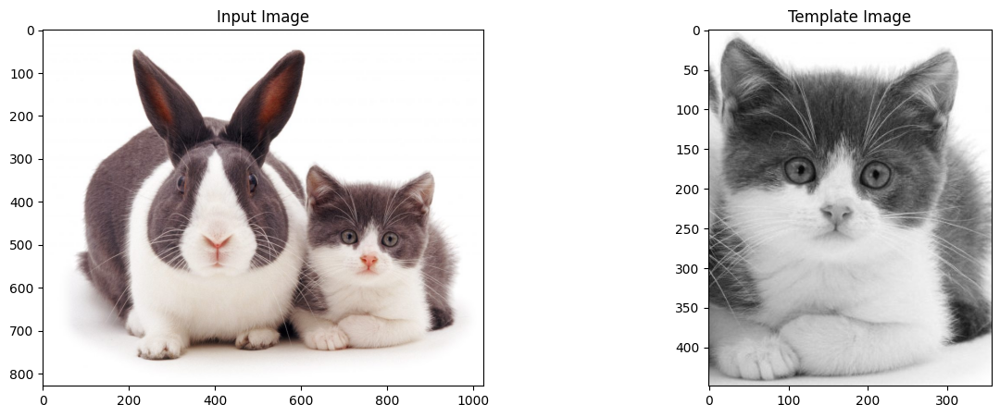

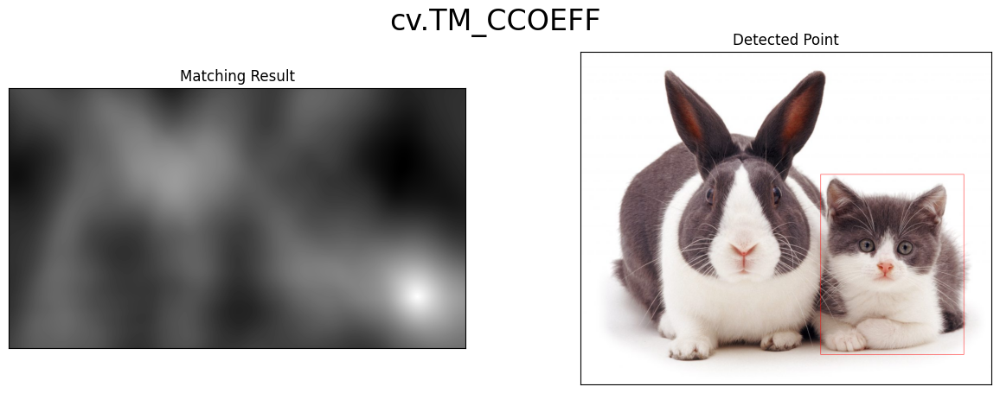

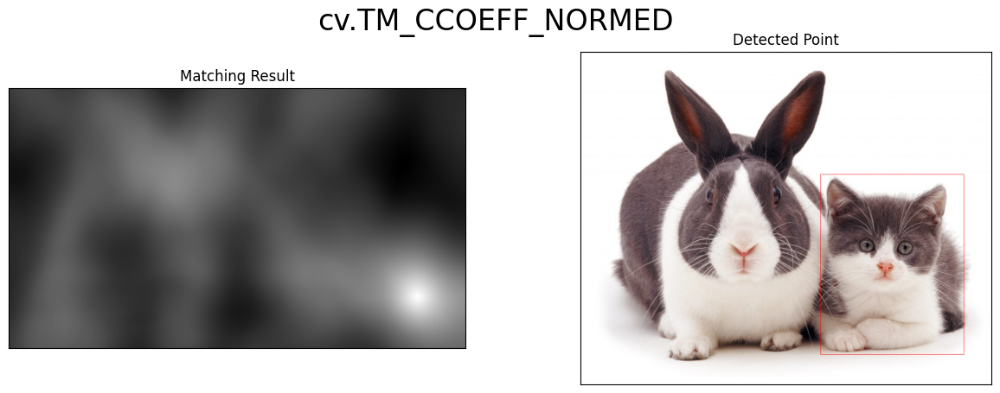

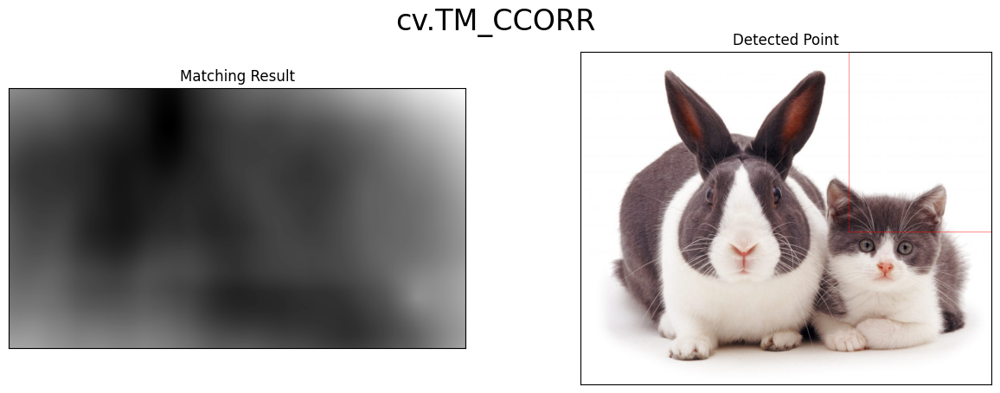

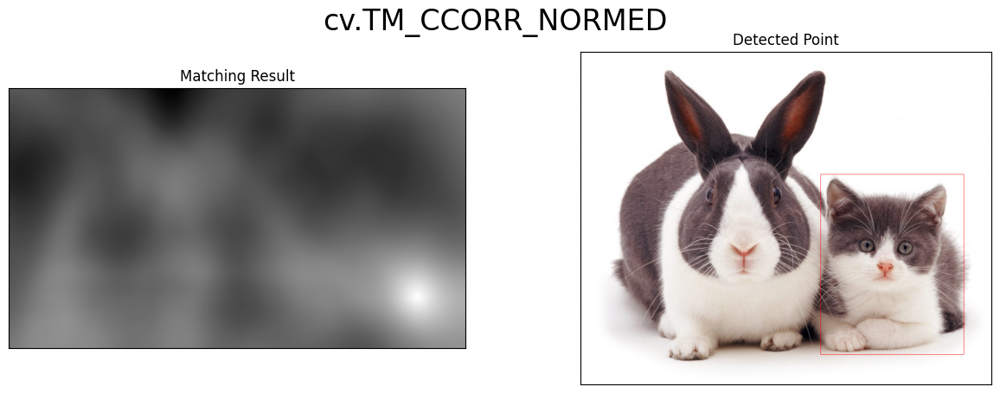

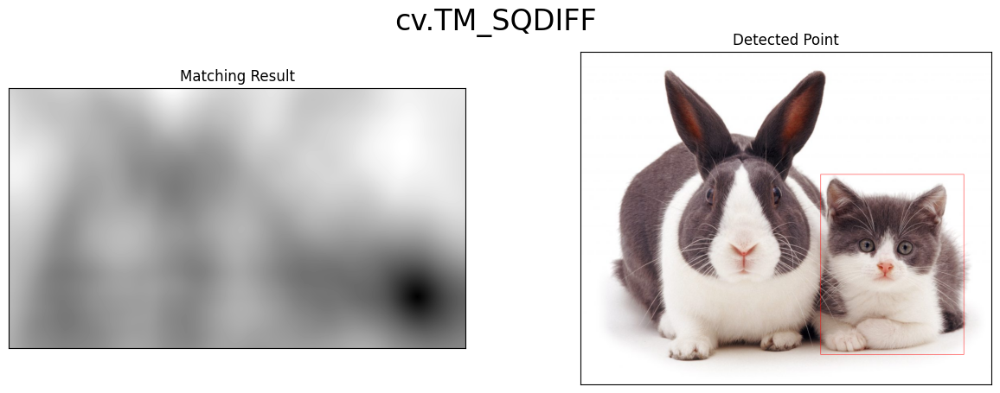

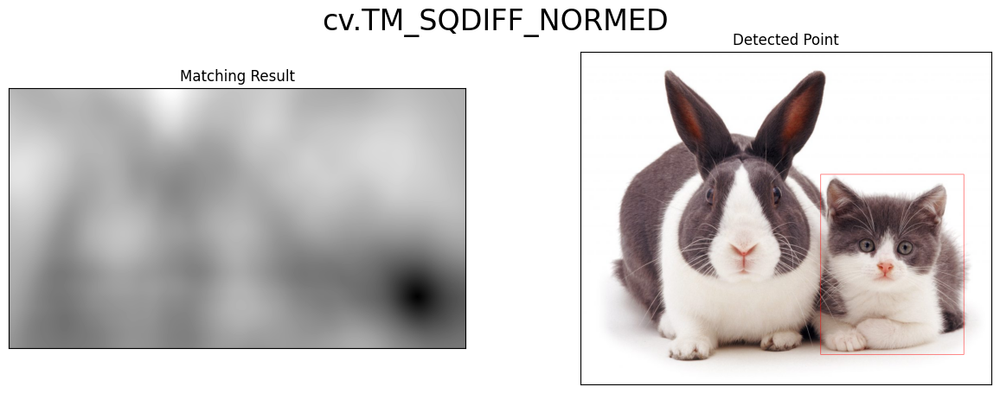

In [ ]:
img = cv.imread('/content/drive/MyDrive/pcvk_week11/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img_copy = img.copy()

template = cv.imread('/content/drive/MyDrive/pcvk_week11/cat2_templatejpg.jpg',0)
# mengatur dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("Input Image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("Template Image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img_copy.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=24)
    plt.show()

3. Implementasikan konsep template matching tanpa menggunakan library openCV untuk multiple object

Text(0.5, 1.0, 'Result')

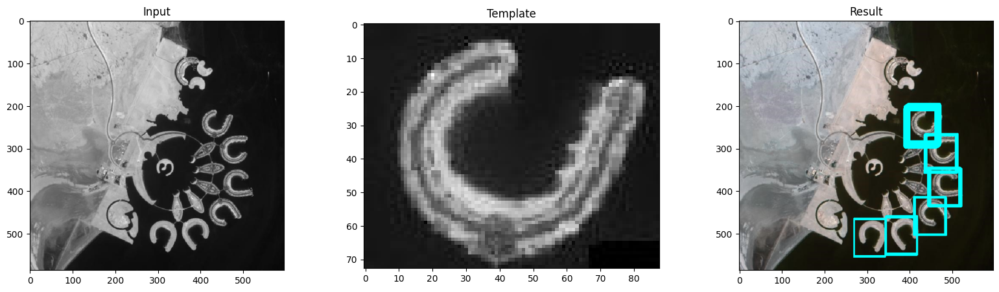

In [ ]:
from google.colab.patches import cv_imshow

img = cv.imread('/content/drive/MyDrive/pcvk_week11/bahrain.jpg',0)
template = cv.imread('/content/drive/MyDrive/pcvk_week11/bahrain-template.jpg', 0)
img_copy = cv.imread('/content/drive/MyDrive/pcvk_week11/bahrain.jpg')
# Dapatkan ukuran gdambar asli dan template
tinggi, lebar = template.shape[::-1]

# Lakukan template matching dengan metode CCOEFF
result = cv.matchTemplate(img, template, cv.TM_CCOEFF_NORMED)

# Dapatkan lokasi dengan nilai korelasi tertinggi
min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

# Tentukan batasan threshold (misalnya, 0.8) untuk hasil yang dianggap cocok
threshold = 0.43

# Dapatkan lokasi hasil yang di atas threshold
lokasi_cocok = np.where(result >= threshold)

# Gambar kotak di sekitar area yang cocok
for pt in zip(*lokasi_cocok[::-1]):
    cv.rectangle(img_copy, pt, (pt[0] + lebar, pt[1] + tinggi), (0, 255, 255), 1)

# Tampilkan gambar asli dengan kotak-kotak hasil yang cocok
fig, axarr = plt.subplots(1, 3, figsize=(20,5))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[0].set_title('Input')
axarr[1].imshow(template, cmap='gray')
axarr[1].set_title('Template')
axarr[2].imshow(img_copy, cmap='gray')
axarr[2].set_title('Result')

4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection dan Laplacian Edge detection pada openCV

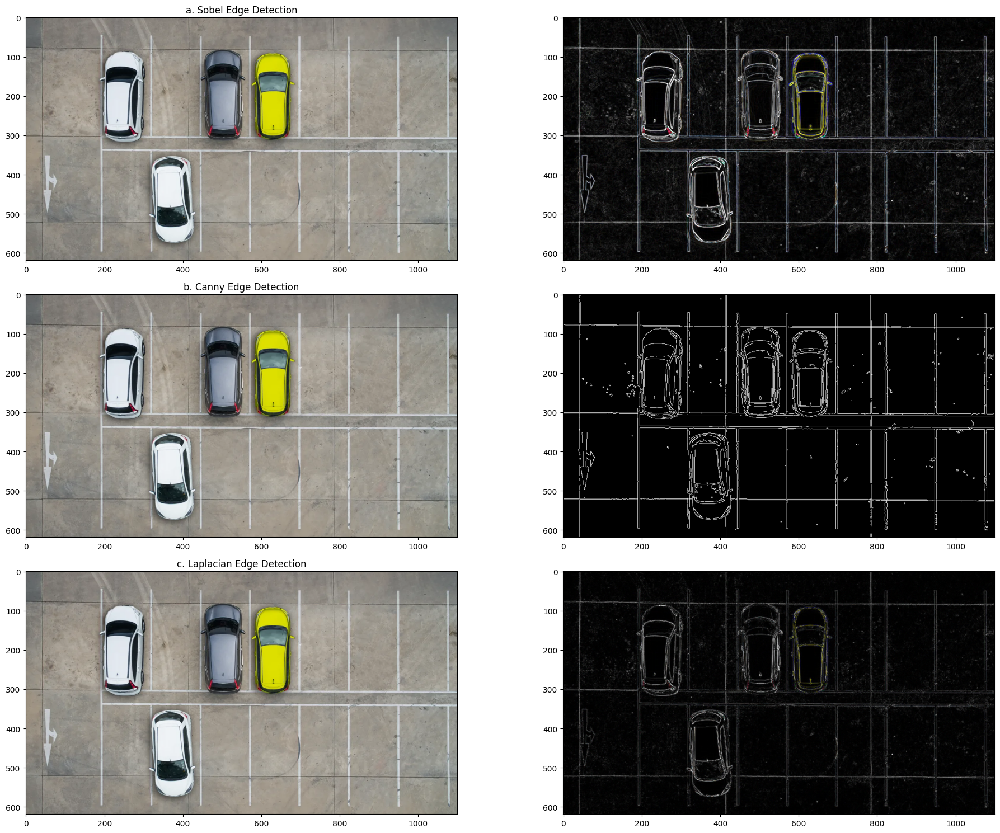

In [ ]:
img = cv.imread('/content/drive/MyDrive/pcvk_week11/car-park.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img1 = cv.GaussianBlur(gray, (3, 3), 0)

img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

edges_canny = cv.Canny(img, 100, 200)

img_laplacian = cv.Laplacian(img, cv.CV_64F)
img_laplacian = cv.convertScaleAbs(img_laplacian)


f, axarr = plt.subplots(3, 2, figsize=(20, 15))  # 3 baris, 2 kolom

axarr[0, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[0, 0].set_title('a. Sobel Edge Detection')
axarr[0, 1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

axarr[1, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[1, 0].set_title('b. Canny Edge Detection')
axarr[1, 1].imshow(cv.cvtColor(edges_canny, cv.COLOR_BGR2RGB))

axarr[2, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[2, 0].set_title('c. Laplacian Edge Detection')
axarr[2, 1].imshow(cv.cvtColor(img_laplacian, cv.COLOR_BGR2RGB))

plt.tight_layout()
plt.show()

5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada
OpenCV

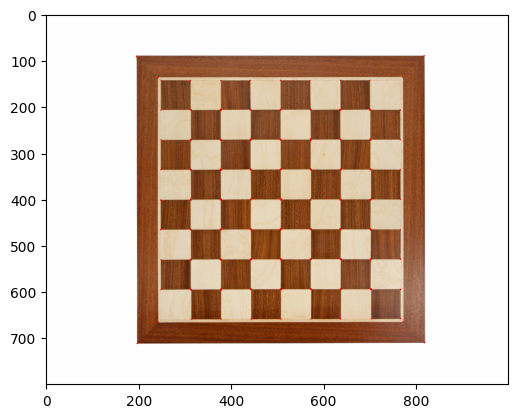

In [ ]:
#Harris Corner Detection

img = cv.imread('/content/drive/MyDrive/pcvk_week11/chess-board.jpg')
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)
#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
img[dst>0.01*dst.max()]=[0,0,255]

plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

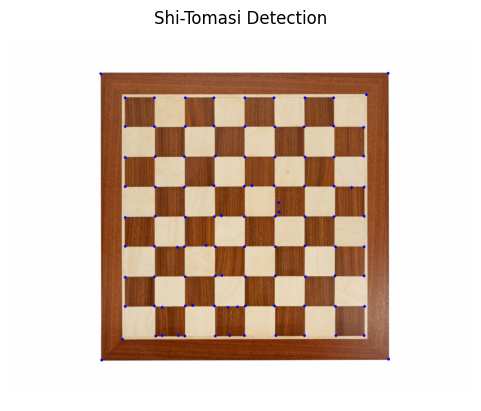

In [ ]:
#shi - thomasi

img = cv.imread('/content/drive/MyDrive/pcvk_week11/chess-board.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Metode Shi-Tomasi Detection
corners = cv.goodFeaturesToTrack(gray, 100, 0.01, 10)

# Konversi koordinat titik sudut ke bilangan bulat
corners = np.int0(corners)

# Gambar lingkaran pada setiap sudut yang ditemukan
for corner in corners:
    x, y = corner.ravel()
    cv.circle(img, (x, y), 3, 255, -1)

# Tampilkan hasil Shi-Tomasi Detection
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Detection')
plt.axis('off')
plt.show()

6. Implementasikan metode Hough Transform pada OpenCV

number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


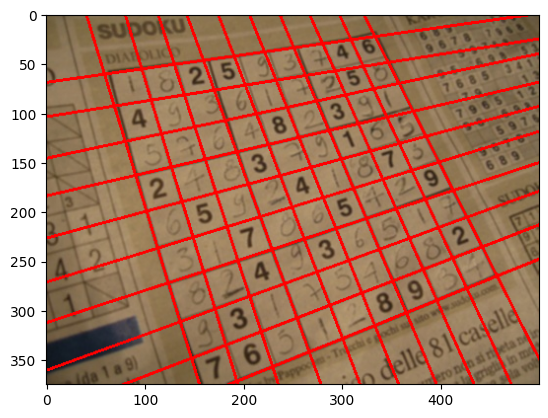

In [ ]:
input_img = cv.imread('/content/drive/MyDrive/pcvk_week11/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gray, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)


if not lines.any():
    print('No lines found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(input_img, (x1, y1), (x2,y2),(0,0,255),2)

    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection

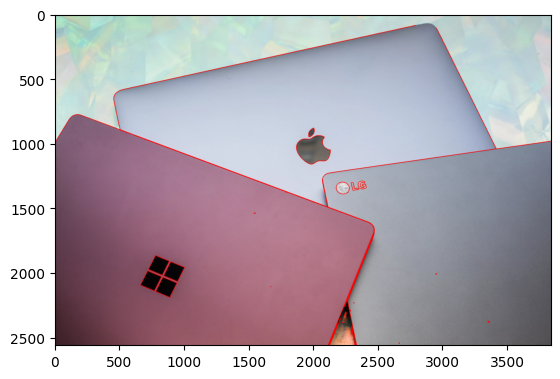

In [ ]:
img = cv.imread('/content/drive/MyDrive/pcvk_week11/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

# **E. Pengayaan Materi KTP**

1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban

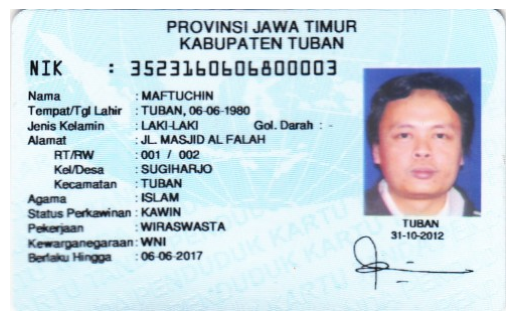

In [11]:
img_ktp = cv.imread('/content/drive/MyDrive/KTP_More/ktp3.png')

plt.axis('off')
plt.imshow(cv.cvtColor(img_ktp, cv.COLOR_BGR2RGB))

2. Muat Library

In [4]:
import cv2
import os

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori dataset tersebut

In [5]:
#lokasi hasil pelat
path_plate = "/content/drive/MyDrive/KTP_More"

#Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  file_path = cv2.imread(os.path.join(path_plate, name_file))
  blurred = file_path.copy()
  gray = blurred.copy()

In [12]:
# Lokasi hasil pemotongan gambar KTP
path_plate = "/content/drive/MyDrive/KTP_More"

# List untuk menyimpan nama file di direktori
file_names = []

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
    # Mendapatkan path lengkap file
    file_path = os.path.join(path_plate, name_file)

    # Membaca gambar dari file
    src = cv2.imread(file_path)

    # Operasi lain yang ingin Anda lakukan pada gambar
    if src is not None:
            blurred = src.copy()
            gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

    # Menambahkan nama file ke dalam list
    file_names.append(name_file)

# Menampilkan daftar nama file
for file_name in file_names:
    print("Nama file:", file_name)

Nama file: KTP7.jpeg
Nama file: ktp.png
Nama file: ktp1.png
Nama file: ktp2.png
Nama file: ktp3.png
Nama file: ktp4.png
Nama file: ktp5.png
Nama file: ktp6.png


4. Masih pada looping file direktori, terapkan Gauzzian Blur untuk setiap file supaya noise pickle dapat direduksi

In [16]:
#filterring
for i in range(10):
  blurred = cv2.GaussianBlur(img_ktp, (5,5), 0.5)

5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan binerisasi citra (thresholding)

168.0 (300, 493)


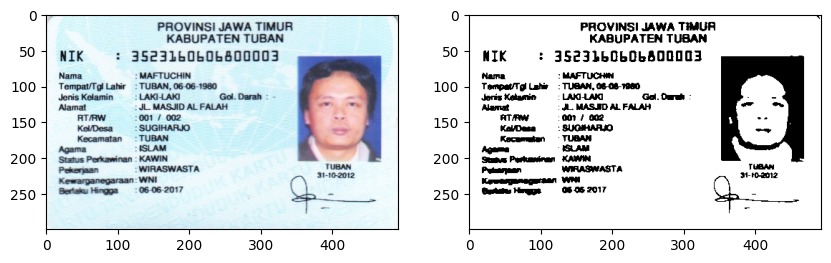

In [17]:
#Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(ret, bw.shape)
#Tampilkan gambar asli dan hasil deteksi tepi
f, axarr = plt.subplots(1,2, figsize=(10,5))
axarr[0].imshow(cv2.cvtColor(img_ktp, cv2.COLOR_BGR2RGB))
axarr[1].imshow(bw, cmap='gray')
plt.show()

6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan

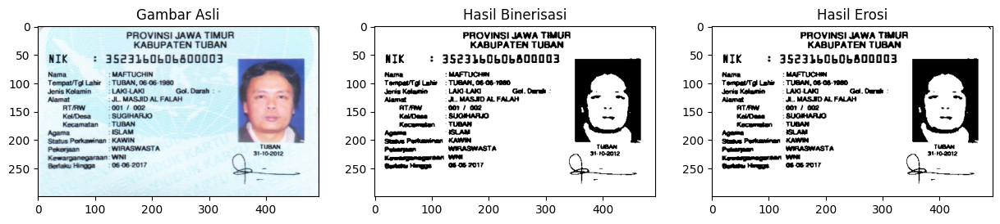

In [19]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Terapkan operasi morfologi erosi
morf = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

# Tampilkan gambar asli, hasil deteksi tepi, dan hasil erosi
f, axarr = plt.subplots(1, 3, figsize=(15, 5))
axarr[0].imshow(cv2.cvtColor(img_ktp, cv2.COLOR_BGR2RGB))
axarr[0].set_title("Gambar Asli")
axarr[1].imshow(bw, cmap='gray')
axarr[1].set_title("Hasil Binerisasi")
axarr[2].imshow(morf, cmap='gray')
axarr[2].set_title("Hasil Erosi")
plt.show()

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek. Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik (karena hasil akuisisi setiap citra dapat berbeda).

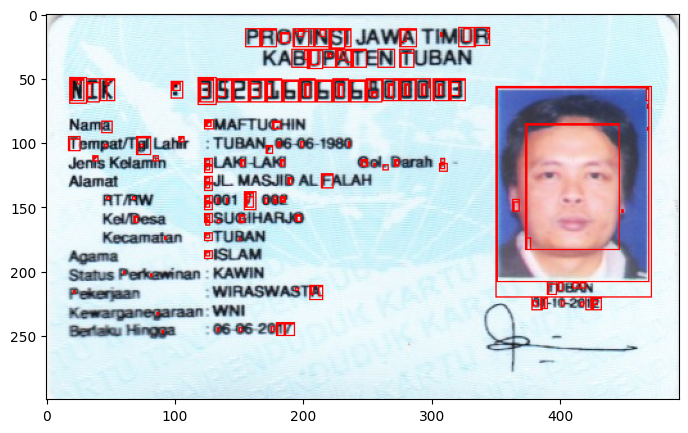

In [24]:
blurred = cv.GaussianBlur(img_ktp, (5, 5), 0.5)

gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

morf = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(morf.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 4 and w >= 1 and float(ras) <= 1:
      cv.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 2 and w >= 1 and float(ras) <= 1:
      cv.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

plt.figure(figsize=(10,5))
plt.imshow(cv.cvtColor(img_ktp, cv.COLOR_BGR2RGB))

# **F. Tugas Praktikum**

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan secara berkelompok dengan aturan sebagai berikut:

Kelompok 1 – KTP Riyanto Sleman

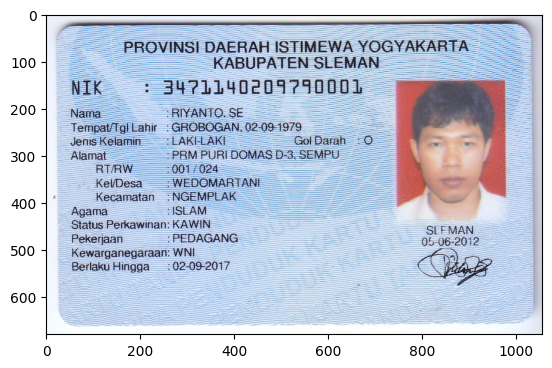

In [26]:
ktp_tugas = cv.imread('/content/drive/MyDrive/KTP_More/ktp.png')
plt.imshow(cv.cvtColor(ktp_tugas, cv.COLOR_BGR2RGB))

In [27]:
def extract_and_draw_contours(image):
    # Apply Gaussian Blur
    blurred = cv2.GaussianBlur(image, (5, 5), 0.5)

    # Convert to grayscale
    gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

    # Thresholding using Otsu's method
    ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Erode the binary image
    erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

    # Extract contours
    contours, hierarchy = cv2.findContours(erode.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Loop through contours
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')

        # Adjust the conditions based on your requirements
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
        elif h >= 8 and w >= 8 and float(ras) <= 10:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
        elif h >= 10 and w >= 7 and float(ras) <= 8:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

    return image

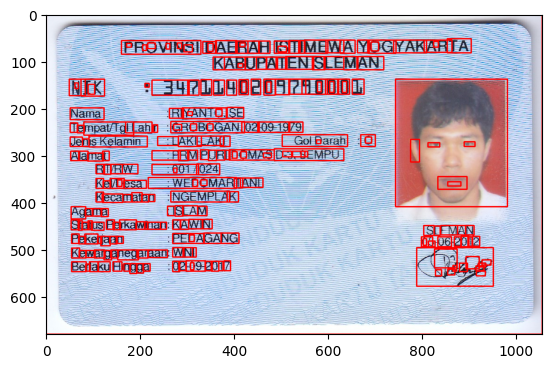

In [29]:
# Call the function
result_image = extract_and_draw_contours(ktp_tugas)
# Display the result
result_rgb = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)
plt.imshow(result_rgb)
plt.show()